In [66]:
import json
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image, ImageDraw
import random
import csv

This block lists all files and directories under /kaggle/input. It helps in understanding the dataset structure and confirming the path to the data files.

Loads JSON annotations for both training and validation datasets. These annotations contain essential data such as image IDs and segmentation information for the training images.

In [67]:
train_images = '/kaggle/input/trashcan-segmentation-public/trashcan-segmentation-public/train/train'  
train_json = '/kaggle/input/trashcan-segmentation-public/trashcan-segmentation-public/train.json'

val_images = '/kaggle/input/trashcan-segmentation-public/trashcan-segmentation-public/test'  
val_json = '/kaggle/input/trashcan-segmentation-public/trashcan-segmentation-public/test-without_segmentation.json'

with open(train_json, 'r') as f:
    train_annotations = json.load(f)
    
with open(val_json, 'r') as f:
    val_annotations = json.load(f)

In [68]:
def dataset_shape(images_dir):

    image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]
    num_images = len(image_files)
    
    first_image = Image.open(os.path.join(images_dir, image_files[0]))
    image_size = first_image.size
    print(num_images, image_size)
    
print("Train dataset shape:")
dataset_shape(train_images)

print("Test dataset shape:")
dataset_shape(val_images)

Train dataset shape:
6065 (480, 270)
Test dataset shape:
1147 (480, 270)


These functions are used to both visualize training images with their corresponding segmentation polygons drawn over them and validation images. 

In [69]:
def draw_polygons_on_image(image, polygons):
    """
    Draws polygons on an image.
    Args:
    - image (PIL.Image): The image on which to draw.
    - polygons (list of np.array): List of polygons (each polygon is np.array of points).
    Returns:
    - PIL.Image: Image with polygons drawn on it with alpha transparency.
    
    """
    rgba_image = Image.new("RGBA", image.size)
    draw = ImageDraw.Draw(rgba_image)
    for polygon in polygons:
        points = tuple(map(tuple, polygon))  
        draw.polygon(points, outline=(255,0,255,255), fill=((255,0,255,128)))
    
    combined = Image.alpha_composite(image.convert("RGBA"), rgba_image)
    return combined.convert('RGBA')

def draw_bw_polygons_on_image(image, polygons):
    """
    Draws polygons on an image.
    Args:
    - image (PIL.Image): The image on which to draw.
    - polygons (list of np.array): List of polygons (each polygon is np.array of points).
    Returns:
    - PIL.Image: Image with polygons drawn on it with alpha transparency.
    
    """
    bw_image = Image.new("1", image.size, 1)
    draw = ImageDraw.Draw(bw_image)
    for polygon in polygons:
        points = tuple(map(tuple, polygon))  
        draw.polygon(points, outline=0, fill=0)
    
    return bw_image

def visualize_images(images_dir, annotations=None):
    """
    Args:
    - images_dir (str): Directory containing the images.
    - annotations (dict): The loaded annotations from the json file.
    """
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))  
    axs = axs.flatten()

    image_ids = [image['id'] for image in annotations['images']]
    chosen_ids = np.random.choice(image_ids, 5, replace=False)
    chosen_ids = np.append(chosen_ids , 6)
    print(f"chosen ids is {chosen_ids}")
    for ax, image_id in zip(axs, chosen_ids):
        print(image_id)
        image_info = next(item for item in annotations['images'] if item['id'] == image_id)
        image_path = os.path.join(images_dir, image_info['file_name'])
        image = Image.open(image_path)
        
        if 'annotations' in annotations:
            segmentation_polygons = []
            for ann in annotations['annotations']:
                if ann['image_id'] == image_id:
                    for polygon in ann['segmentation']:
                        segmentation_polygons.append(np.array(polygon).reshape(-1, 2))

            image = draw_polygons_on_image(image, segmentation_polygons)
            
        ax.imshow(image)
        ax.axis('off')
    plt.tight_layout()
    plt.show()
    
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))  
    axs = axs.flatten()
    seg_arrays = []
    for ax, image_id in zip(axs, chosen_ids):
        image_info = next(item for item in annotations['images'] if item['id'] == image_id)
        image_path = os.path.join(images_dir, image_info['file_name'])
        image = Image.open(image_path)
        
        if 'annotations' in annotations:
            segmentation_polygons = []
            for ann in annotations['annotations']:
                if ann['image_id'] == image_id:
                    for polygon in ann['segmentation']:
                        segmentation_polygons.append(np.array(polygon).reshape(-1, 2))

            bw_image = draw_bw_polygons_on_image(image, segmentation_polygons)
            seg_array = np.invert(np.array(bw_image))*1
            seg_arrays.append(seg_array)
        ax.imshow(bw_image)
        ax.axis('off')
    plt.tight_layout()
    plt.show()
    
    return seg_arrays
        
        
    
    

Train Images with segmentations
chosen ids is [ 160 2465  428 4093 1264    6]
160
2465
428
4093
1264
6


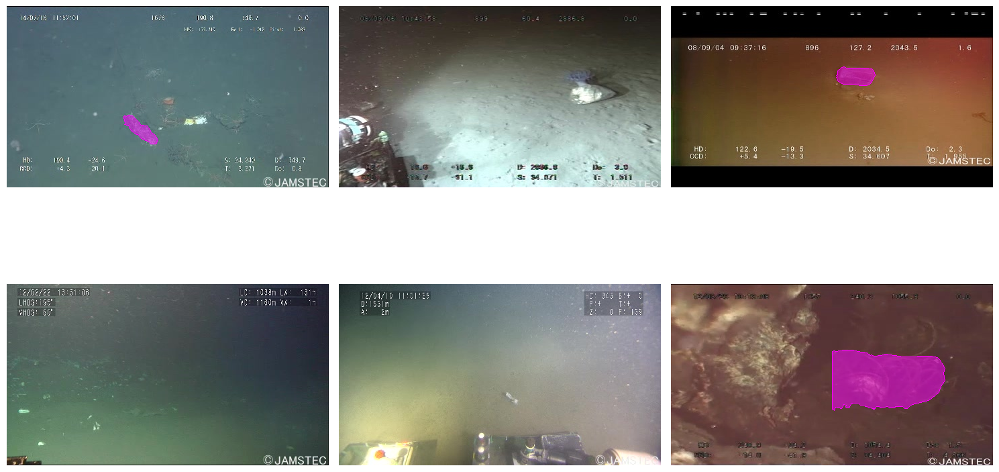

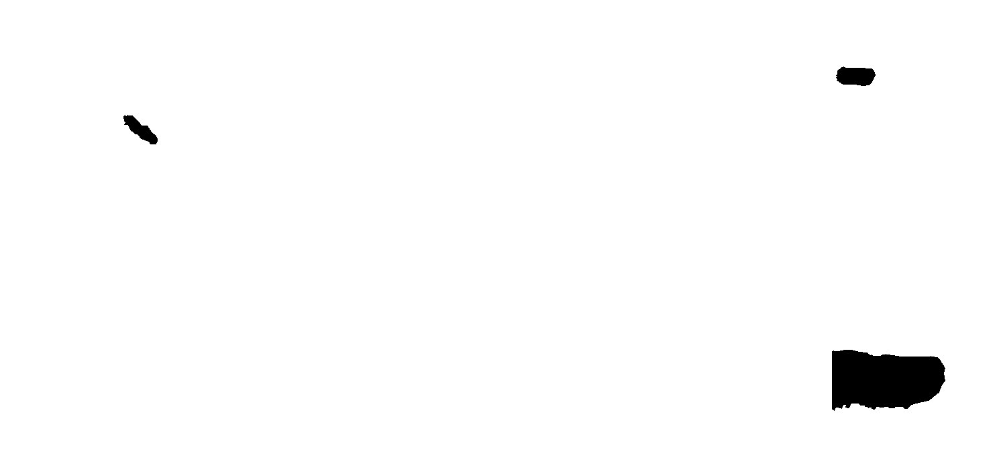

In [70]:
print('Train Images with segmentations')
seg_arrays = visualize_images(train_images, train_annotations)

In [71]:
image_ids =  [image['id'] for image in train_annotations['images']]
len(image_ids)

6065

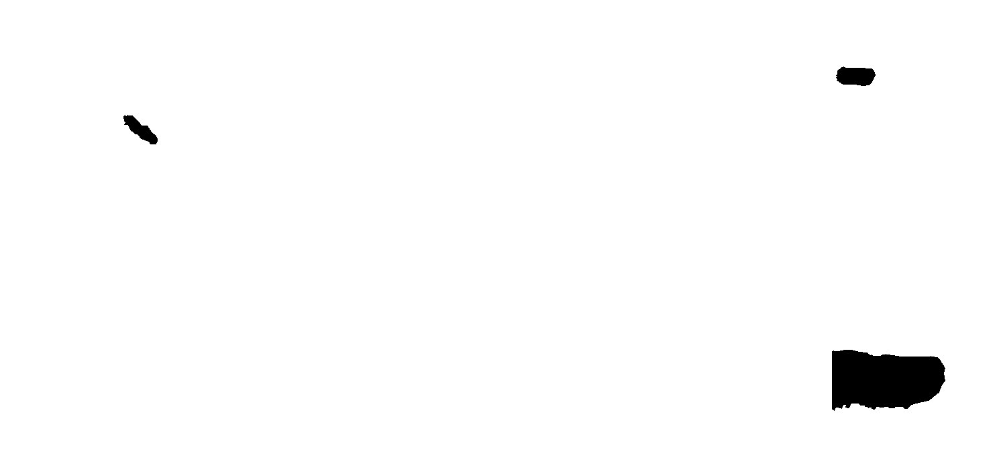

In [72]:
fig, axs = plt.subplots(2, 3, figsize=(15, 10))  
axs = axs.flatten()
for ax, seg_array in zip(axs, seg_arrays):
    ax.imshow(seg_array, cmap='binary')
    ax.axis('off')
plt.tight_layout()
plt.show()

In [73]:
print('Val Images')
# visualize_images(val_images, val_annotations)

Val Images


Great! After visualizing our training and validation images, the next step is to start working on the segmentation model. As a starting point, for the sample submission on Kaggle, we can implement a simple function that creates a mask with a single random circle drawn on it. The circle's center and radius are chosen randomly within the bounds of the image. To accommodate the requirement that some images contain no trash and must have a blank mask, we also modify the mask generation process so that there is a certain probability (for example, 10%) that an blank mask is generated. This will allow to establish a baseline and ensure that our submission pipeline works correctly before implementing more sophisticated models.

In [74]:
def create_random_circle_mask(image_size):

    mask = Image.new('L', image_size, 0)  
    draw = ImageDraw.Draw(mask)
    radius = np.random.randint(20, min(image_size)//4)  
    x = np.random.randint(radius, image_size[0] - radius)
    y = np.random.randint(radius, image_size[1] - radius)
    draw.ellipse((x - radius, y - radius, x + radius, y + radius), fill=1)
    return np.array(mask)

Lets visualize random masks (filled circles) on 6 random validation images, and see what we have.

Val Images with Random Masks


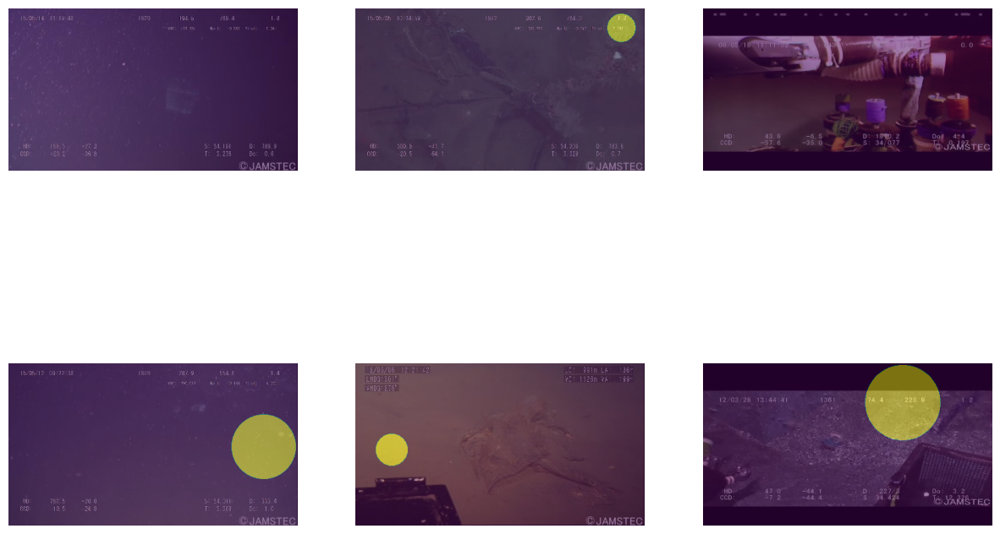

In [75]:
def visualize_val_images_with_masks(val_images_dir):
    
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))
    axs = axs.flatten()
    image_files = [f for f in os.listdir(val_images_dir) if f.endswith('.jpg')]
    selected_images = np.random.choice(image_files, 6, replace=False)

    for ax, img_file in zip(axs, selected_images):
        img_path = os.path.join(val_images_dir, img_file)
        image = Image.open(img_path)
        if random.random() < 0.1:  
            mask = np.zeros((image.height, image.width), dtype=np.uint8)
        else:
            mask = create_random_circle_mask(image.size)
        mask_image = Image.fromarray((mask * 255).astype('uint8')) 

        ax.imshow(image)
        ax.imshow(mask_image, cmap='viridis', alpha=0.5)  
        
        ax.axis('off')
    plt.show()

print('Val Images with Random Masks')
visualize_val_images_with_masks(val_images)

The competition uses run-length encoding to encode the binary predictions and evaluate solutions. Below, we give functions needed to convert your segmentations into the needed format. 

Mainly, the prepare_submission function generates a submission file by applying random masks to validation images and encoding these masks using run_length_encode. It handles cases where some images might intentionally not have masks to simulate correct "no object" predictions.

In [76]:
def run_length_encode(mask):
    pixel_values = mask.flatten()
    encoded_values = []
    current_pixel = pixel_values[0]
    count = 1

    for pixel in pixel_values[1:]:
        if pixel == current_pixel:
            count += 1
        else:
            encoded_values.extend([current_pixel, count])
            current_pixel = pixel
            count = 1

    
    encoded_values.extend([current_pixel, count])
    return encoded_values

mask = create_random_circle_mask((270, 480))
encoded_mask = run_length_encode(mask)

mask_shape = mask.shape

def run_length_decode(encoded_mask, mask_shape):
    encoded_mask = np.array(encoded_mask).reshape(-1,2)
    
    
    decoded1 = []
    for number_freq in encoded_mask:
        number = number_freq[0]
        freq = number_freq[1]
        
        decoded1.extend([number]*freq)
     
    decoded1 = np.array(decoded1)
    
    decoded1 = decoded1.reshape(mask_shape)
        
    return decoded1

decoded_mask = run_length_decode(encoded_mask, mask_shape)

print(np.allclose(mask, decoded_mask))

True


In [77]:
image_id_map = {item['file_name']: item['id'] for item in val_annotations['images']}

In [78]:
def create_submission(val_images_dir, image_id_map, output_file="sample_submission.csv"):
    with open(output_file, 'w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(['image_id', 'Mask'])

        for img_file, img_id in image_id_map.items():
            img_path = os.path.join(val_images_dir, img_file)
            image = Image.open(img_path)
            
            if random.random() < 0:  
                mask = np.zeros((image.height, image.width), dtype=np.uint8) 
            else:
                mask = create_random_circle_mask(image.size)
    
            encoded_mask = run_length_encode(mask)
            writer.writerow([img_id, ' '.join(map(str, encoded_mask))])
            print(f"mask is:\n{mask}")
            print(mask.shape)
            print(f"encoded mask is:\n{encoded_mask}")
            encoded_mask = np.array(encoded_mask).reshape(-1,2)
            break

print("Preparing submission...")
create_submission(val_images, image_id_map)
print("Submission is ready.")

Preparing submission...
mask is:
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
(270, 480)
encoded mask is:
[0, 10643, 1, 13, 0, 462, 1, 23, 0, 454, 1, 29, 0, 449, 1, 33, 0, 445, 1, 37, 0, 441, 1, 41, 0, 437, 1, 45, 0, 434, 1, 47, 0, 431, 1, 51, 0, 428, 1, 53, 0, 426, 1, 55, 0, 424, 1, 57, 0, 422, 1, 59, 0, 420, 1, 61, 0, 418, 1, 63, 0, 416, 1, 65, 0, 414, 1, 67, 0, 412, 1, 69, 0, 411, 1, 69, 0, 410, 1, 71, 0, 408, 1, 73, 0, 407, 1, 73, 0, 406, 1, 75, 0, 405, 1, 75, 0, 404, 1, 77, 0, 403, 1, 77, 0, 402, 1, 79, 0, 401, 1, 79, 0, 400, 1, 81, 0, 399, 1, 81, 0, 399, 1, 81, 0, 398, 1, 83, 0, 397, 1, 83, 0, 397, 1, 83, 0, 397, 1, 83, 0, 397, 1, 83, 0, 396, 1, 85, 0, 395, 1, 85, 0, 395, 1, 85, 0, 395, 1, 85, 0, 395, 1, 85, 0, 395, 1, 85, 0, 395, 1, 85, 0, 395, 1, 85, 0, 395, 1, 85, 0, 395, 1, 85, 0, 395, 1, 85, 0, 395, 1, 85, 0, 395, 1, 85, 0, 396, 1, 83, 0, 397, 1, 83, 0, 397, 1, 83, 0, 397, 1, 83, 0, 397, 1, 83, 0, 398

In [79]:
def make_bw_segmentation(segmentation, image_size):
     segmentation_polygons = []
     for polygon in segmentation:
         segmentation_polygons.append(np.array(polygon).reshape(-1, 2))
     bw_image = Image.new('1', image_size, 1)
     draw = ImageDraw.Draw(bw_image)
     for polygon in segmentation_polygons:
        points = tuple(map(tuple, polygon))  
        draw.polygon(points, outline=0, fill=0)
     seg_array = np.invert(np.array(bw_image))
     seg_array = seg_array*1
     return seg_array

def make_blank_image(image_size):
     bw_image = Image.new('1', image_size, 1)
     seg_array = np.invert(np.array(bw_image))
     seg_array = seg_array*1
     return seg_array
  
seg_array = make_blank_image((480, 270))

In [80]:
blank_array = make_blank_image((480, 270))

In [81]:
os.path.join(train_images, train_annotations['images'][0]['file_name'])

'/kaggle/input/trashcan-segmentation-public/trashcan-segmentation-public/train/train/vid_000159_frame0000008.jpg'

In [82]:
image_ids = []
for item in train_annotations['images']:
    image_ids.append(item['id'])

In [83]:
annotation_ids=[]
for item in train_annotations["annotations"]:
    annotation_ids.append(item["id"])

In [84]:
import shutil
if os.path.isdir('/kaggle/working/masks/'):
    shutil.rmtree('/kaggle/working/masks/')

In [85]:
os.mkdir('/kaggle/working/masks/', mode=0o666)
from PIL import ImageOps

In [86]:
def draw_bw_polygons_on_image(image, polygons):
    """
    Draws polygons on an image.
    Args:
    - image (PIL.Image): The image on which to draw.
    - polygons (list of np.array): List of polygons (each polygon is np.array of points).
    Returns:
    - PIL.Image: Image with polygons drawn on it with alpha transparency.
    
    """
    bw_image = Image.new("1", image.size, 1)
    draw = ImageDraw.Draw(bw_image)
    for polygon in polygons:
        points = tuple(map(tuple, polygon))  
        draw.polygon(points, outline=0, fill=0)
    
    return bw_image

def generate_masks(images_dir, annotations=None):
    """
    Args:
    - images_dir (str): Directory containing the images.
    - annotations (dict): The loaded annotations from the json file.
    """
    targets = []
    i = 0
    directory_path = '/kaggle/working/masks/'
    for image in annotations['images']:
        image_id = image['id']
        image_info = next(item for item in annotations['images'] if item['id'] == image_id)
        image_path = os.path.join(images_dir, image_info['file_name'])
        image = Image.open(image_path)
        target = {}
        target['id'] = image_id
        target['file_name'] = image_path
        if 'annotations' in annotations:
            segmentation_polygons = []
            count = 0
            for ann in annotations['annotations']:
                if ann['image_id'] == image_id:
                    count = count + 1
                    for polygon in ann['segmentation']:
                        segmentation_polygons.append(np.array(polygon).reshape(-1, 2))
            if count:
                target['is_annotated'] = True
            else:
                target['is_annotated'] = False
            bw_image = draw_bw_polygons_on_image(image, segmentation_polygons)
            seg_array = np.invert(np.array(bw_image))*1
            bw_image2 = Image.fromarray((seg_array.astype(np.uint8))*255).convert('L')
            bw_image2.save(directory_path + f'target_file_{i}.png')
            target['bw_image_path'] = directory_path + f'target_file_{i}.png'
            target['annotations'] = seg_array
            i = i + 1
        targets.append(target)
    return targets

In [87]:
targets = generate_masks(train_images, train_annotations)

In [88]:
len(targets)

6065

In [89]:
import tensorflow as tf
import numpy as np

from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Dropout 
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import concatenate

In [90]:
def double_conv_block(inputs=None, n_filters=32, dropout_prob=0, max_pooling=True):
    
    conv = Conv2D(n_filters,
                  3,   
                  activation='relu',
                  padding='same',
                  kernel_initializer='he_normal')(inputs)
    conv = Conv2D(n_filters,
                  3,
                  activation='relu',
                  padding='same',
                  kernel_initializer='he_normal')(conv)

    if dropout_prob > 0:
        conv = Dropout(rate=dropout_prob)(conv)
         
    if max_pooling:
        if (conv.shape[1]%2==0) and (conv.shape[2]%2 == 0):
            next_layer = MaxPooling2D(pool_size=(2, 2), strides=(2,2),padding='valid')(conv)
        else:
            next_layer = MaxPooling2D(pool_size=(3, 2), strides=(2,2),padding='valid')(conv) 
    else:
        next_layer = conv
        
    skip_connection = conv
    
    return next_layer, skip_connection

In [91]:
def upsampling_block1(expansive_input, contractive_input, n_filters=32):
    up = Conv2DTranspose(
                 n_filters,
                 (3,2),
                 strides=(2,2),
                 padding='valid')(expansive_input)

    merge = concatenate([up, contractive_input], axis=3)
    conv = Conv2D(n_filters,
                 (3,3),
                 activation='relu',
                 padding='same',
                 kernel_initializer='he_normal')(merge)
    conv = Conv2D(n_filters,
                 (3,3),
                 activation='relu',
                 padding='same',
                 kernel_initializer='he_normal')(conv)
    return conv

def upsampling_block2(expansive_input, contractive_input, n_filters=32):
    up = Conv2DTranspose(
                 n_filters,
                 (2,2),
                 strides=(2,2),
                 padding='valid')(expansive_input)

    merge = concatenate([up, contractive_input], axis=3)
    conv = Conv2D(n_filters,
                 (3,3),
                 activation='relu',
                 padding='same',
                 kernel_initializer='he_normal')(merge)
    conv = Conv2D(n_filters,
                 (3,3),
                 activation='relu',
                 padding='same',
                 kernel_initializer='he_normal')(conv)
    return conv

In [92]:
def unet_model(input_size=(270, 480, 3), n_filters=32):
    inputs = Input(input_size)
    cblock1 = double_conv_block(inputs=inputs, n_filters=n_filters, dropout_prob=0, max_pooling=True)
    cblock2 = double_conv_block(inputs=cblock1[0], n_filters=n_filters*2, dropout_prob=0, max_pooling=True)
    cblock3 = double_conv_block(inputs=cblock2[0], n_filters=n_filters*4, dropout_prob=0, max_pooling=True)
    cblock4 = double_conv_block(inputs=cblock3[0], n_filters=n_filters*8, dropout_prob=0.3, max_pooling=False)
    
    ublock1 = upsampling_block1(expansive_input=cblock4[0], contractive_input=cblock3[1], n_filters=n_filters*4)
    ublock2 = upsampling_block1(expansive_input=ublock1, contractive_input=cblock2[1], n_filters=n_filters*2)
    ublock3 = upsampling_block2(expansive_input=ublock2, contractive_input=cblock1[1], n_filters=n_filters)
    
    conv5 = Conv2D(filters=n_filters,kernel_size=(3,3),activation='relu',padding='same',kernel_initializer='he_normal')(ublock3)
    conv6 = Conv2D(filters=2, kernel_size=(1,1), activation = None, padding='same')(conv5)
    model = tf.keras.Model(inputs=inputs, outputs=conv6)
    return model
    

In [93]:
input_size = (270,480,3)
n_filters = 32
unet = unet_model(input_size=input_size, n_filters=n_filters)

In [94]:
unet

<Functional name=functional_3, built=True>

In [95]:
unet.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 270, 480,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_16 (Conv2D)  │ (None, 270, 480,  │        896 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_17 (Conv2D)  │ (None, 270, 480,  │      9,248 │ conv2d_16[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 135, 240,  │          0 │ conv2d_17[0][0]   │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_18 (Conv2D)  │ (None, 135, 240,  │     18,496 │ max_pooling2d_3[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 135, 240,  │     36,928 │ conv2d_18[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 67, 120,   │          0 │ conv2d_19[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 67, 120,   │     73,856 │ max_pooling2d_4[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 67, 120,   │    147,584 │ conv2d_20[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 33, 60,    │          0 │ conv2d_21[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 33, 60,    │    295,168 │ max_pooling2d_5[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 33, 60,    │    590,080 │ conv2d_22[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 33, 60,    │          0 │ conv2d_23[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_3  │ (None, 67, 120,   │    196,736 │ dropout_1[0][0]   │
│ (Conv2DTranspose)   │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 67, 120,   │          0 │ conv2d_transpose… │
│ (Concatenate)       │ 256)              │            │ conv2d_21[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_24 (Conv2D)  │ (None, 67, 120,   │    295,040 │ concatenate_3[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_25 (Conv2D)  │ (None, 67, 120,   │    147,584 │ conv2d_24[0][0] 

 Total params: 2,016,802 (7.69 MB)

 Trainable params: 2,016,802 (7.69 MB)

 Non-trainable params: 0 (0.00 B)

In [96]:
unet.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [97]:
sorted(targets, key=lambda x: x['file_name'])

annotated_targets = []
non_annotated_targets = []
for target in targets:
    if target['is_annotated']:
        annotated_targets.append(target)
    else:
        non_annotated_targets.append(target)
        

# targets = annotated_targets

def rmsdiff(im1, im2):
    """Calculate the root mean squared error (RMSE) between two images."""
    diff = np.asarray(im1, dtype=np.float32) - np.asarray(im2, dtype=np.float32)
    mse = np.mean(diff ** 2)
    return np.sqrt(mse)

def compare_images(image_path1, image_path2):
    """Compare two images and return their similarity in percentage."""
    # Open the images
    img1 = Image.open(image_path1).convert('RGB')
    img2 = Image.open(image_path2).convert('RGB')

    # Resize images if they have different dimensions
    if img1.size != img2.size:
        img2 = img2.resize(img1.size)

    # Calculate RMSE
    similarity = rmsdiff(img1, img2)

    # Convert RMSE to percentage
    max_diff = 255 * np.sqrt(3)  # maximum possible RMSE for 8-bit RGB images
    similarity_percent = (similarity / max_diff) * 100

    return similarity_percent



from skimage.metrics import structural_similarity as ssim
from skimage import io

def compare_images2(image_path1, image_path2):
    """Compare two images and return their structural similarity index."""
    img1 = io.imread(image_path1, as_gray=True)
    img2 = io.imread(image_path2, as_gray=True)

    # Compute SSIM between the two images
    similarity = ssim(img1, img2, data_range=img2.max() - img2.min())

    return similarity


timages = set(item[:10] for item in  os.listdir(train_images))

ana = {}
non_ana = {}
for item in timages:
    ana[item]=[]
    non_ana[item] = []
    
for target in targets:
    key = target['file_name'][-27:-17] 
    if target['is_annotated']:
        ana[key].append(target['file_name'])
    else:
        non_ana[key].append(target['file_name'])
        
# red_marks = []
# for prefix in timages:
#     for nonana_link in non_ana[prefix]:
#         for ana_link in ana[prefix]:
#             sim_score = compare_images(ana_link, nonana_link)
#             if sim_score < 2:
#                 red_marks.append(nonana_link)
#                 break
                
# red_marks2 = []
# for prefix in timages:
#     for nonana_link in non_ana[prefix]:
#         for ana_link in ana[prefix]:
#             sim_score = compare_images2(ana_link, nonana_link)
#             if sim_score > 0.945:
#                 red_marks2.append(nonana_link)
#                 break
                
red_marks4 = []
for prefix in timages:
    for nonana_link in non_ana[prefix]:
        for ana_link in ana[prefix]:
            sim_score = compare_images(ana_link, nonana_link)
            if sim_score < 12:
                red_marks4.append(nonana_link)
                break
                
# import json
# with open('/kaggle/working/red_marks.json', 'w') as jsonfile:
#     json.dump(red_marks, jsonfile)
# with open('/kaggle/working/red_marks2.json', 'w') as jsonfile:
#     json.dump(red_marks2, jsonfile)
with open('/kaggle/working/red_marks4.json', 'w') as jsonfile:
    json.dump(red_marks4, jsonfile)


# with open('/kaggle/working/red_marks4.json', 'r') as jsonfile:
#     filer = jsonfile.read()
#     red_marks4 = json.loads(filer)
    
print(len(red_marks4))

new_targets = []
for target in targets:
    if target['file_name'] not in red_marks4:
        new_targets.append(target)
targets = new_targets

1989


In [98]:
len(red_marks4)

1989

In [99]:
len(targets)

4076

In [100]:
# flipped_images_dir = '/kaggle/working/flipped_images/'
# flipped_masks_dir = '/kaggle/working/flipped_masks/'
# if os.path.exists(flipped_images_dir):
#     shutil.rmtree(flipped_images_dir)
# if os.path.exists(flipped_masks_dir):
#     shutil.rmtree(flipped_masks_dir)
    
    
# os.mkdir(flipped_images_dir, mode=0o666)
# os.mkdir(flipped_masks_dir, mode=0o666)

# ij = len(targets) + 1
# flipped_targets = []
# #flip_modes = [0,1,3]
# flip_modes =  [0]


# for target in targets:
#     image_path = target['file_name']
#     mask_path = target['bw_image_path']
#     image = Image.open(image_path)
#     mask = Image.open(mask_path)
#     for flip_mode in flip_modes:
#         flipped_target = {}
#         flip_img = image.transpose(flip_mode)
#         flip_img.save(flipped_images_dir + f'flipped_image_file_{ij}.jpg')
#         flipped_target['id'] = ij
#         flipped_target['file_name'] = flipped_images_dir + f'flipped_image_file_{ij}.jpg'
#         image_annotation_flag = target['is_annotated']
#         flipped_target['is_annotated'] = image_annotation_flag
        
#         if image_annotation_flag:
#             flip_mask = mask.transpose(flip_mode)
#             flip_mask.save(flipped_masks_dir + f'flipped_mask_file_{ij}.png')
#             flipped_target['bw_image_path'] = flipped_masks_dir + f'flipped_mask_file_{ij}.png'
#         else:
#             flipped_target['bw_image_path'] = target['bw_image_path']
        
#         flipped_targets.append(flipped_target)
#         ij = ij+1   
        
# targets = targets + flipped_targets

In [101]:
targets_link_list = [target['bw_image_path'] for target in targets] 

In [102]:
inputs_link_list = [target['file_name'] for target in targets]

In [103]:
target_tensors = tf.constant(targets_link_list)
print(type(target_tensors))

<class 'tensorflow.python.framework.ops.EagerTensor'>


In [104]:
image_filenames = tf.constant((inputs_link_list))
print(type(image_filenames))

<class 'tensorflow.python.framework.ops.EagerTensor'>


In [105]:
dataset = tf.data.Dataset.from_tensor_slices((image_filenames, target_tensors))

In [106]:
def process_path(image_path, mask_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.convert_image_dtype(mask, tf.uint8)
    mask = tf.cast(mask / 255, dtype=tf.uint8)
    return img, mask

In [107]:
image_ds = dataset.map(process_path)

In [108]:
if os.path.isdir('/kaggle/working/results/'):
    shutil.rmtree('/kaggle/working/results/')
os.mkdir('/kaggle/working/results/', mode=0o666)

def display(display_list,k):
    plt.figure(figsize=(12, 4))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[0]))
        if(i>0):
            plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]),cmap='viridis', alpha=0.5)
        plt.axis('off')
    plt.tight_layout()
    plt.savefig(f'/kaggle/working/results/{k}')
    plt.show()

In [109]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]

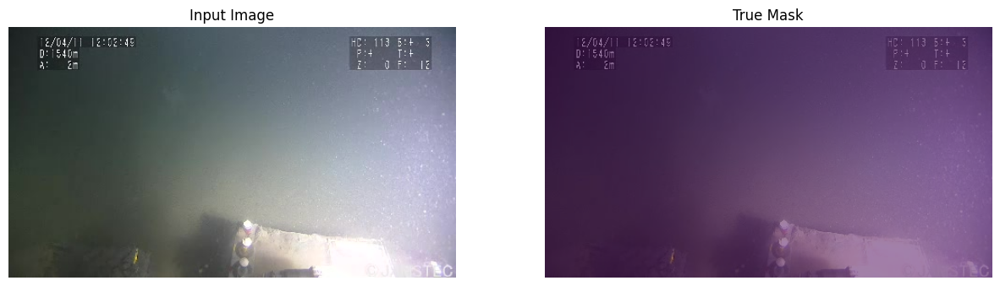

In [110]:
for image, mask in image_ds.take(1):
    display([image, mask],0)

In [111]:
len(targets)

4076

In [112]:
unet.load_weights('/kaggle/input/unetv5/unet_weights9.weights.h5')

In [113]:
# plt.plot(model_history.history["accuracy"])

In [114]:
# EPOCHS = 60
# VAL_SUBSPLITS = 5
# BUFFER_SIZE = 600
# BATCH_SIZE = 32
# train_dataset = image_ds.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
# print(image_ds.element_spec)
# model_history = unet.fit(train_dataset, epochs=EPOCHS)

In [115]:
# def visualize_val_images_with_masks(val_images_dir):
    
#     fig, axs = plt.subplots(2, 3, figsize=(15, 10))
#     axs = axs.flatten()
#     image_files = [f for f in os.listdir(val_images_dir) if f.endswith('.jpg')]
#     selected_images = np.random.choice(image_files, 6, replace=False)

#     for ax, img_file in zip(axs, selected_images):
#         img_path = os.path.join(val_images_dir, img_file)
#         image = Image.open(img_path)
#         if random.random() < 0.1:  
#             mask = np.zeros((image.height, image.width), dtype=np.uint8)
#         else:
#             mask = create_random_circle_mask(image.size)
#         mask_image = Image.fromarray((mask * 255).astype('uint8')) 

#         ax.imshow(image)
#         ax.imshow(mask_image, cmap='viridis', alpha=0.5)  
        
#         ax.axis('off')
#     plt.show()

# print('Val Images with Random Masks')
# visualize_val_images_with_masks(val_images)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 732ms/step


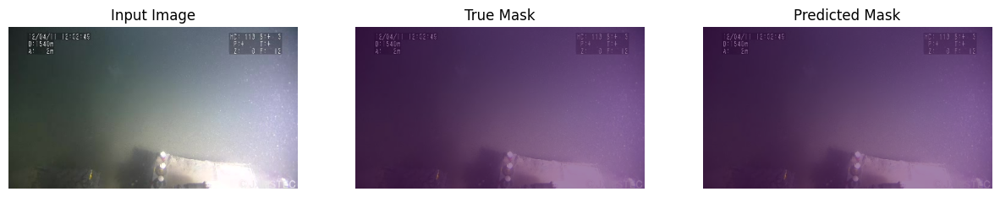

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


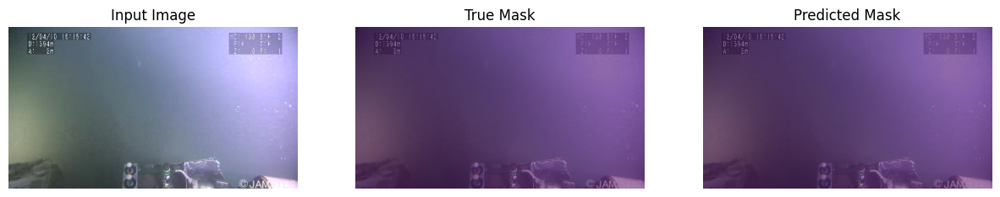

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


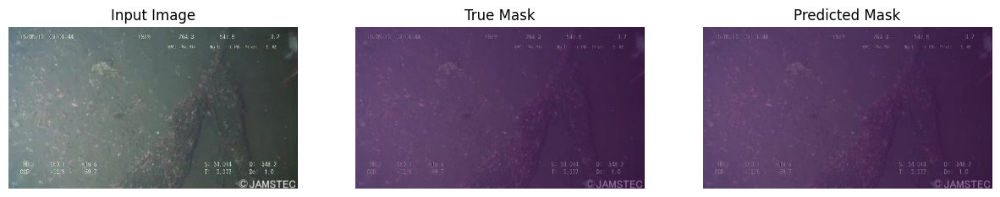

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


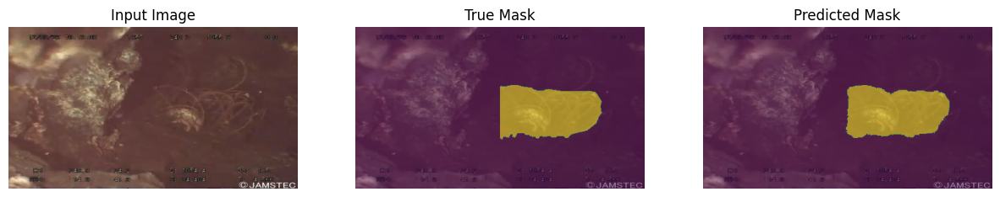

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


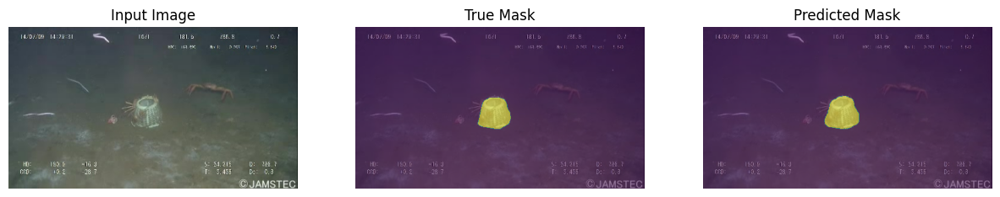

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


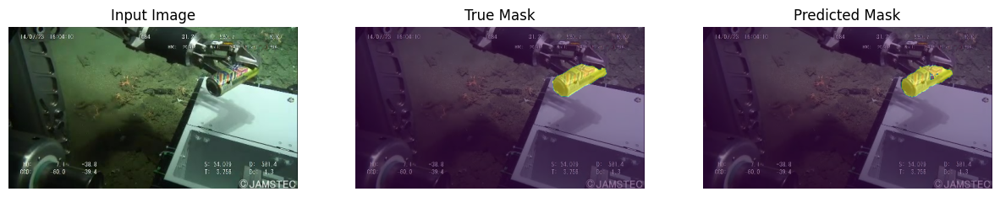

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


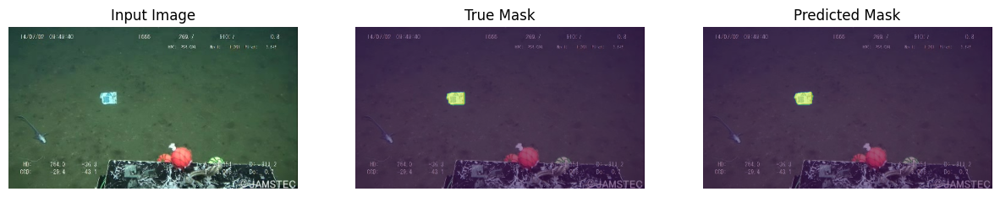

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


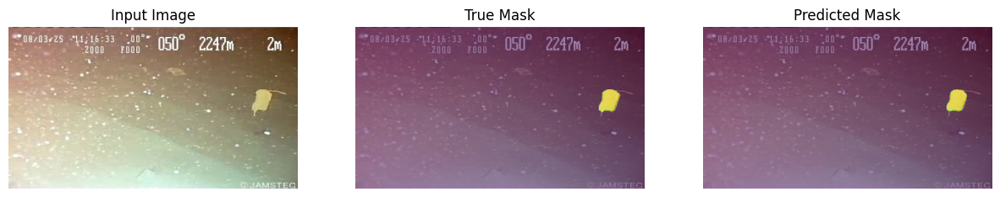

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


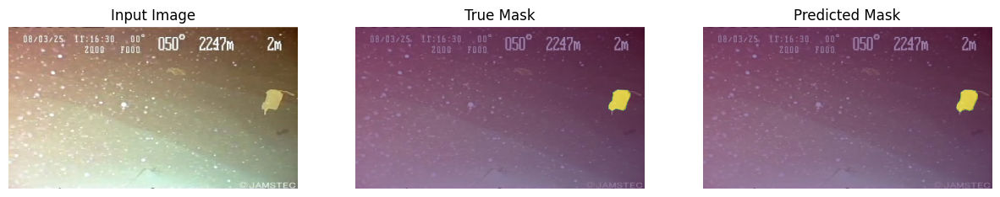

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


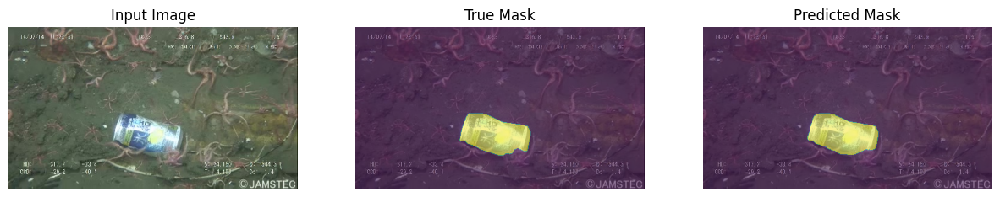

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


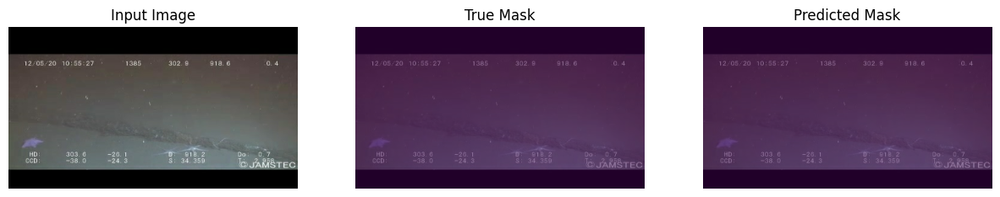

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


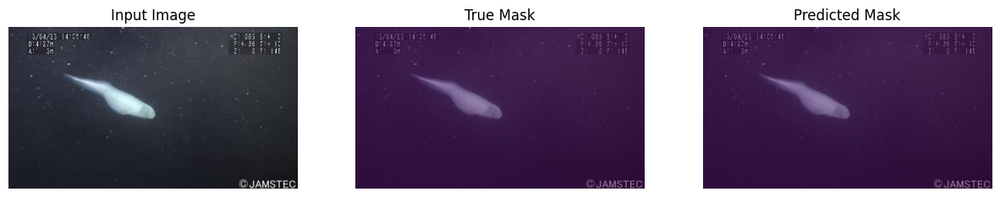

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


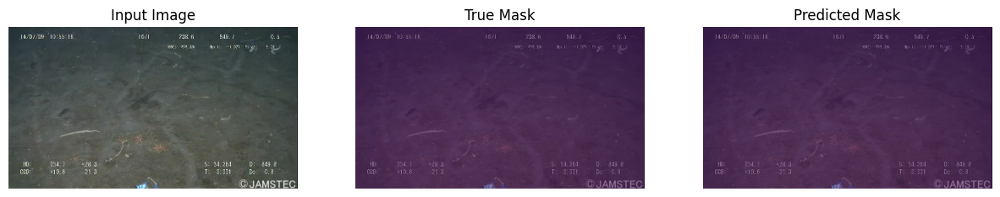

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


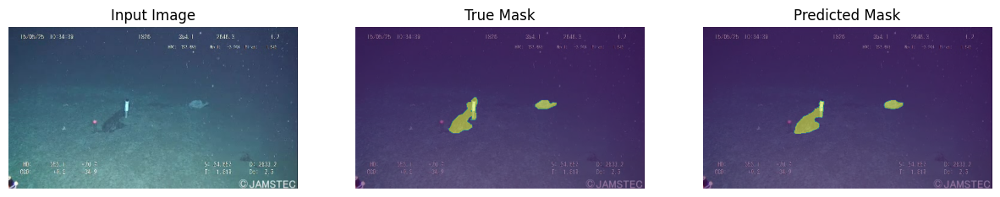

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


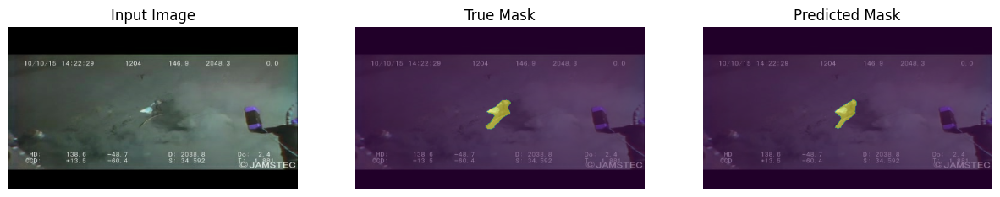

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


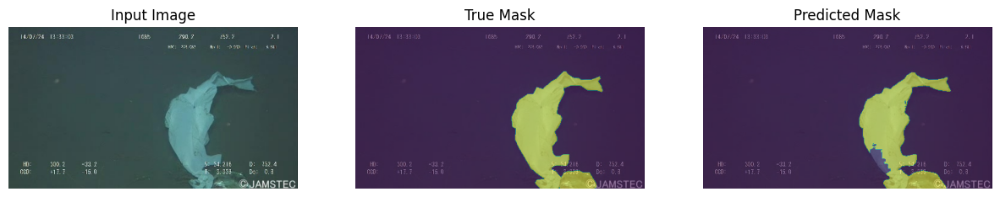

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


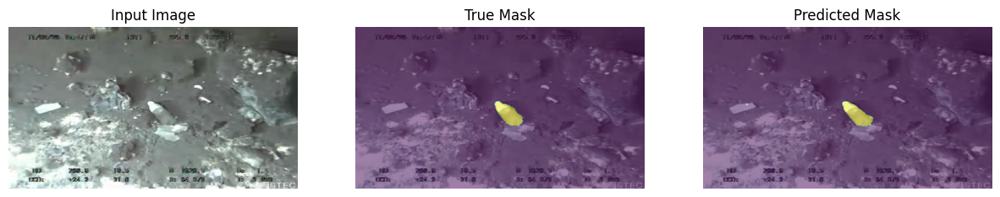

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


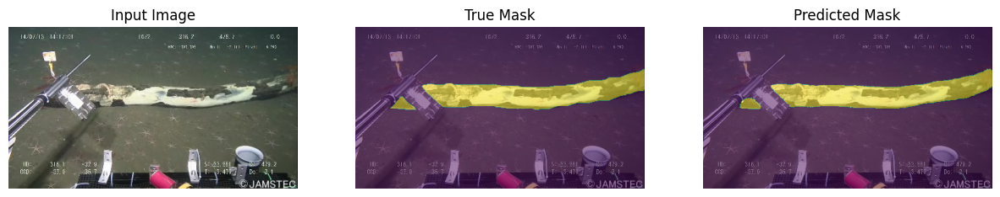

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


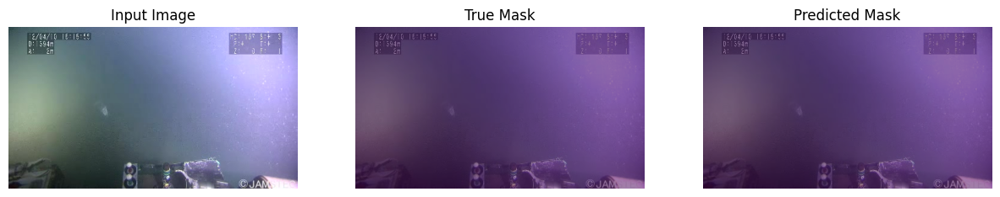

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


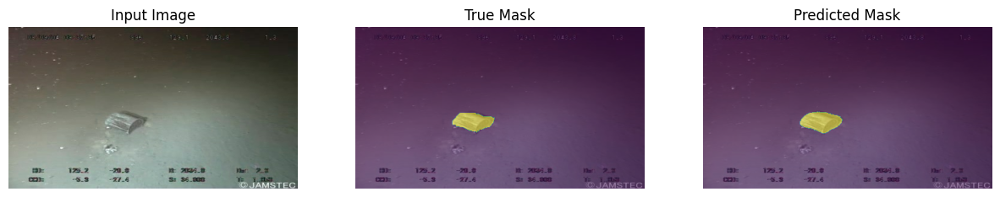

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


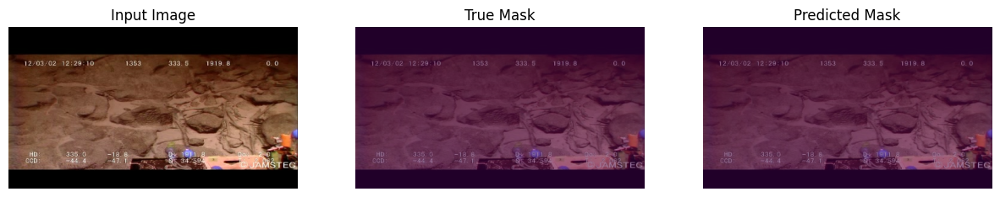

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


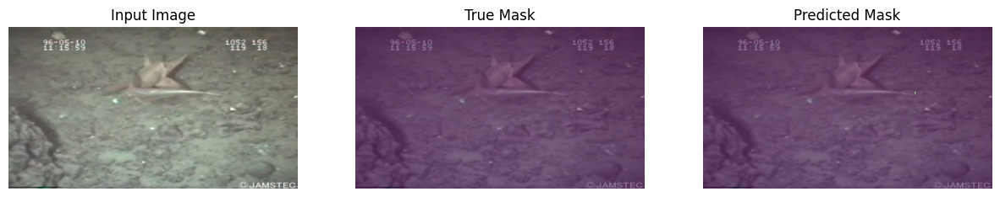

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


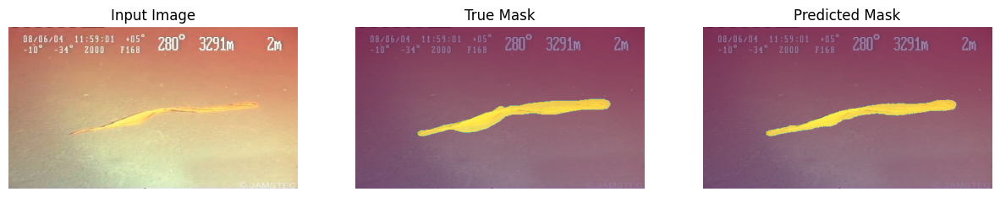

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


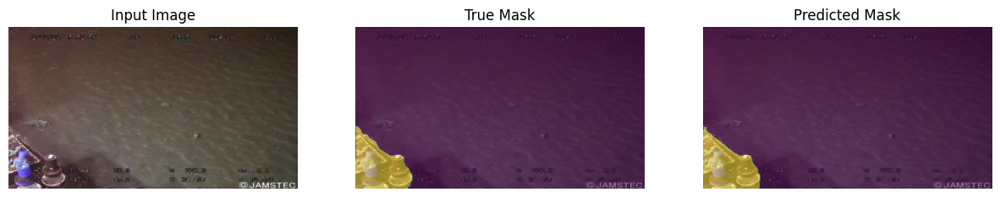

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


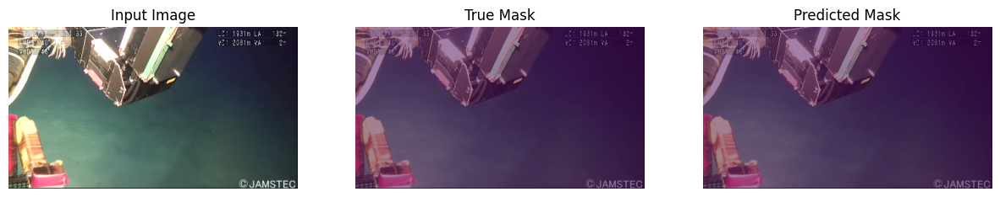

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


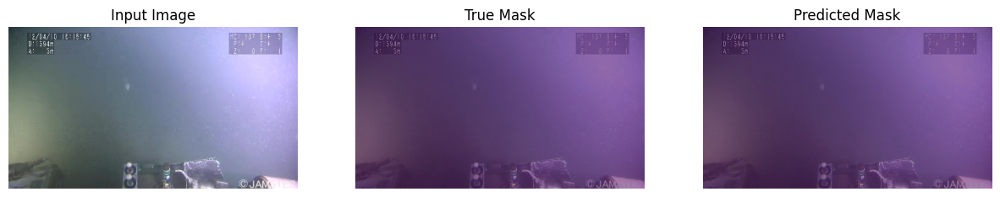

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


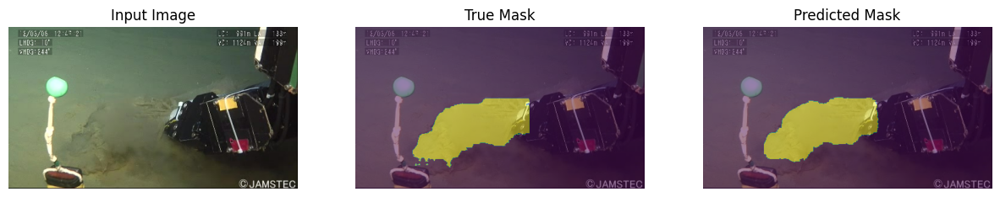

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


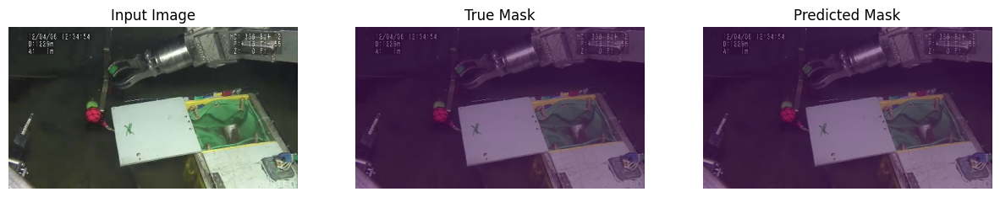

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


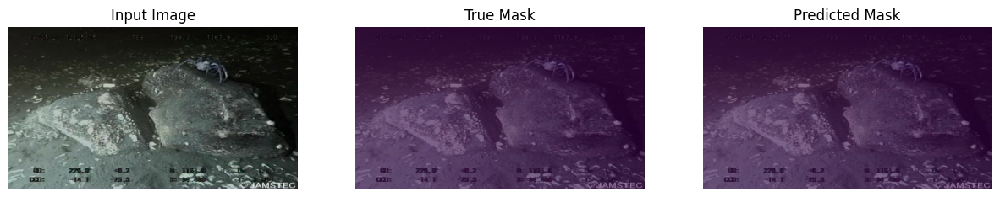

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


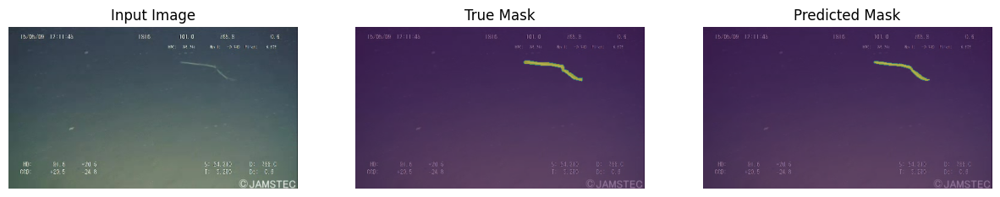

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


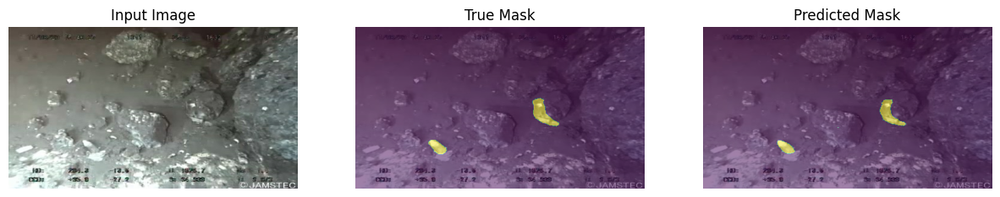

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


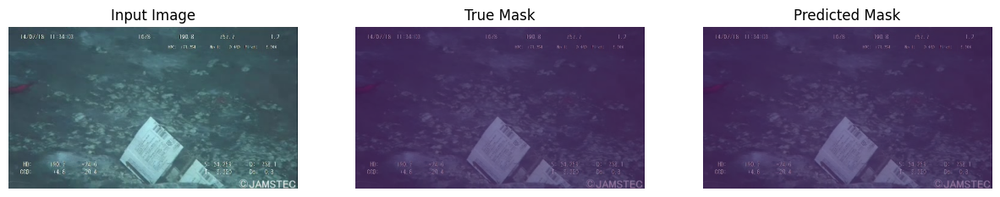

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


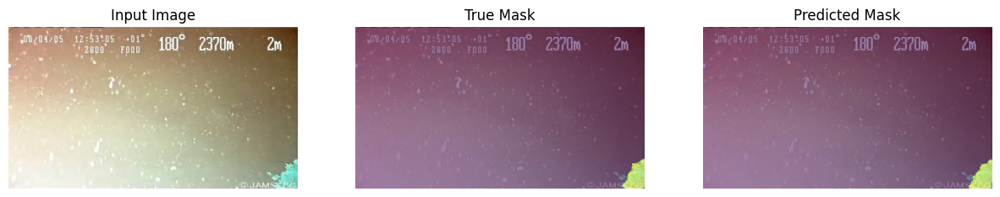

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


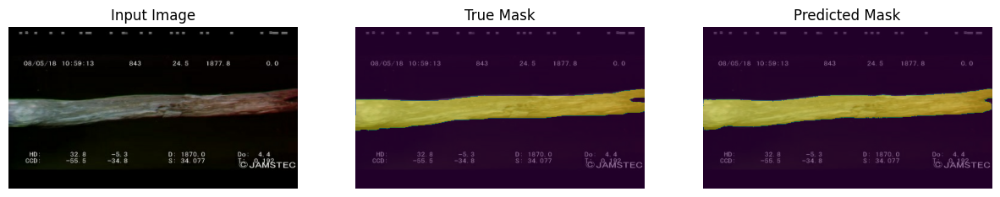

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


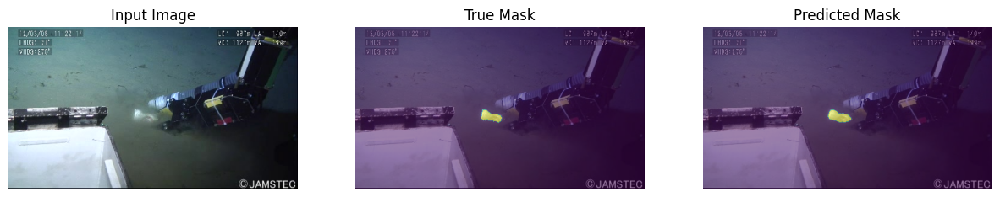

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


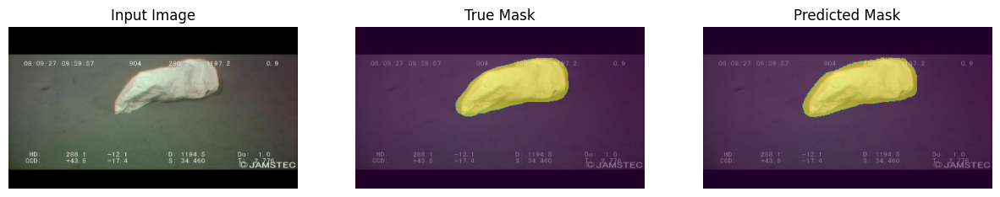

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


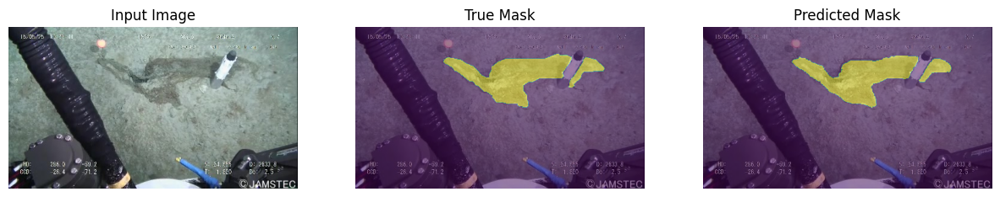

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


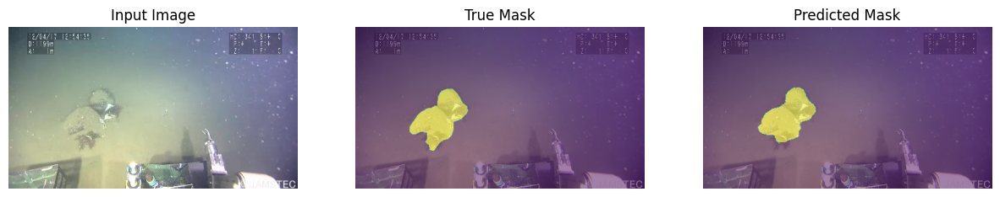

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


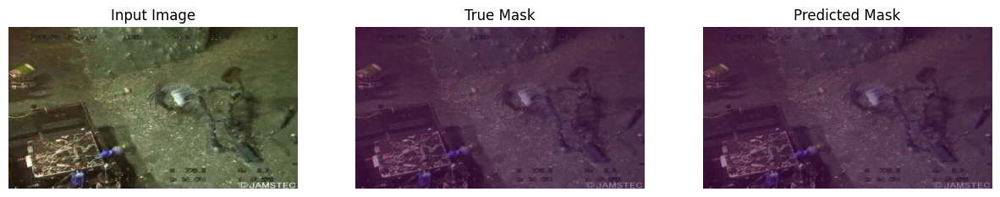

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


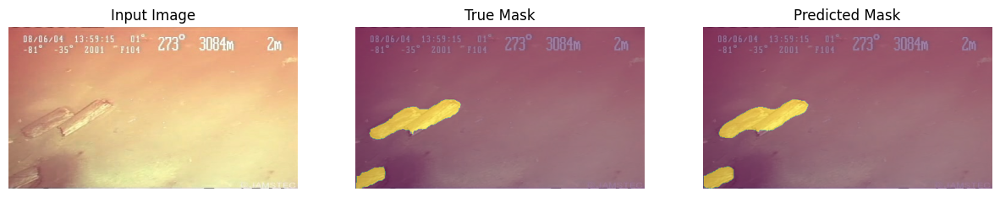

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


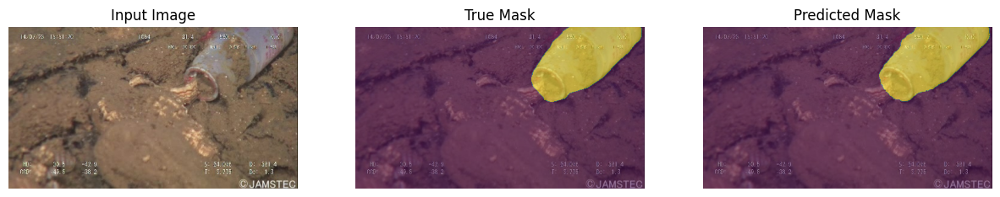

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


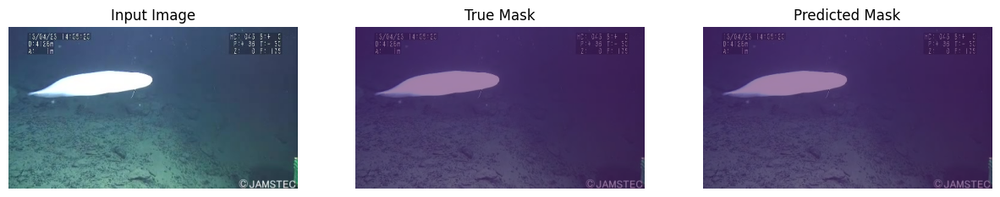

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


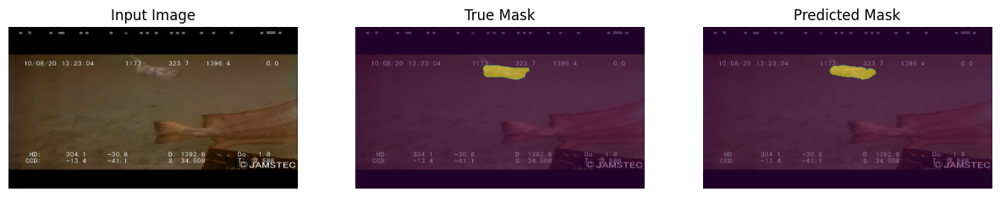

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


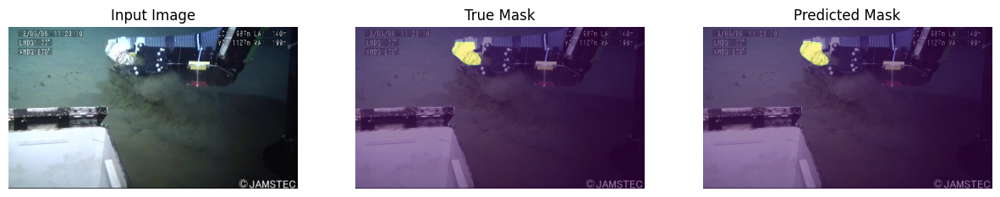

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


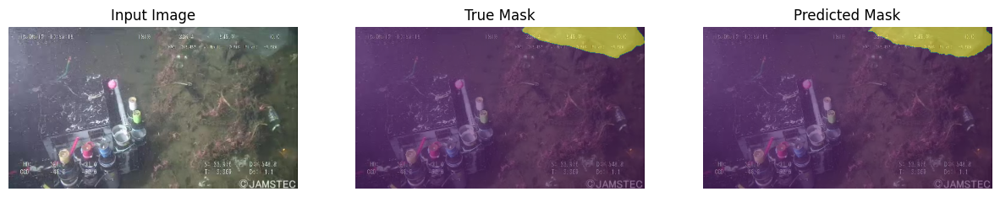

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


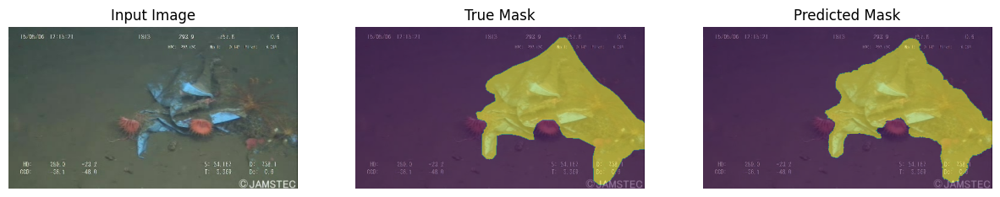

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


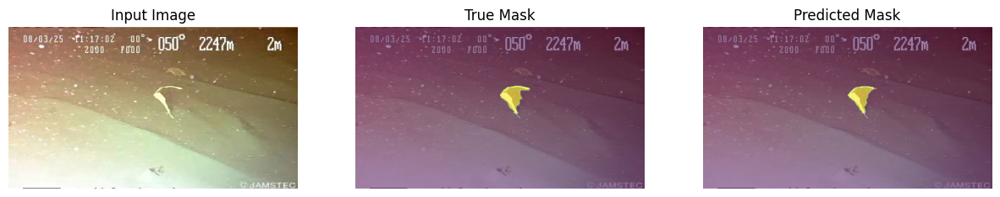

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


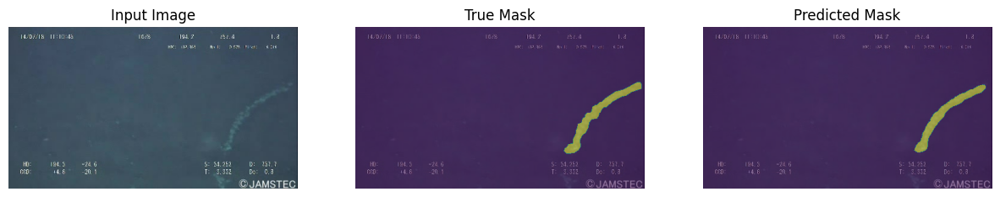

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


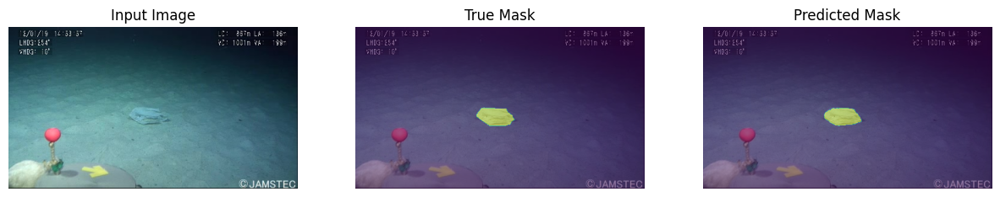

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


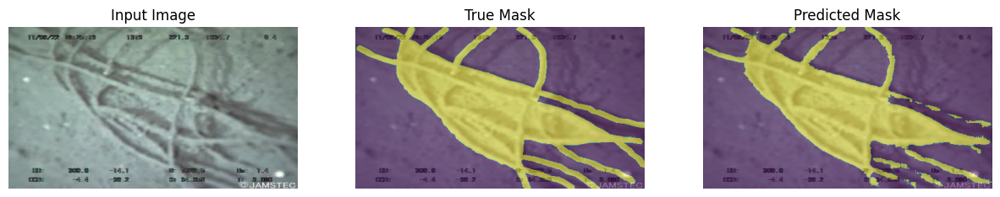

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


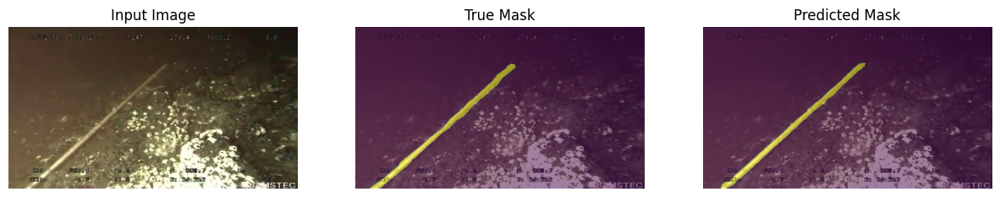

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


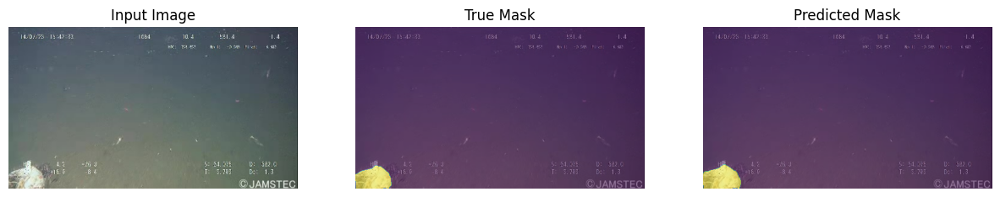

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


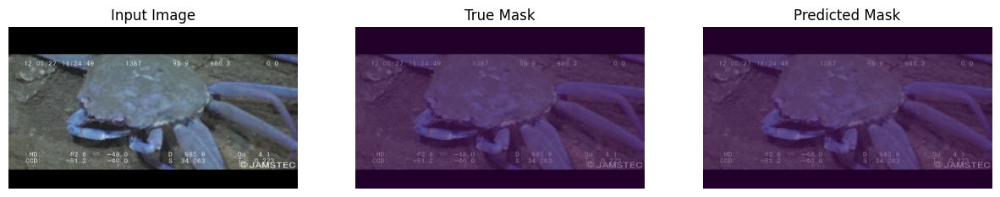

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


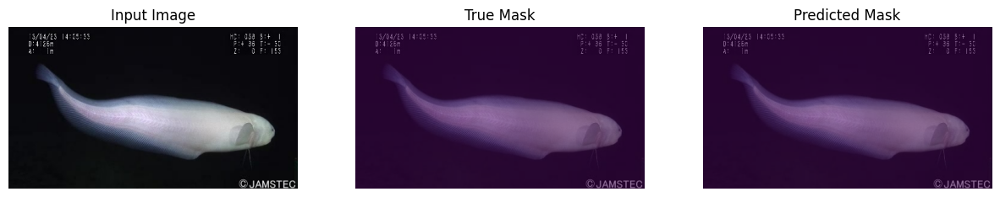

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


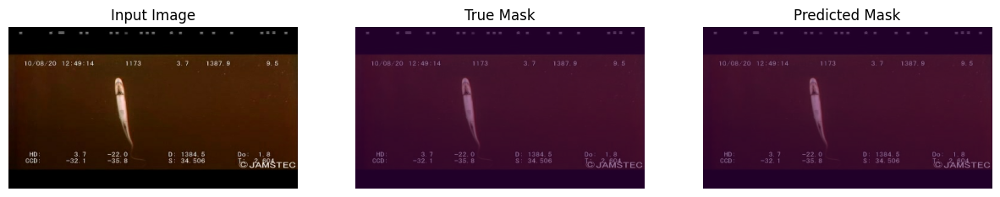

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


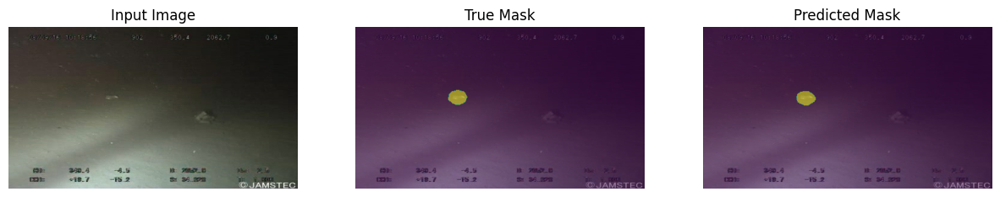

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


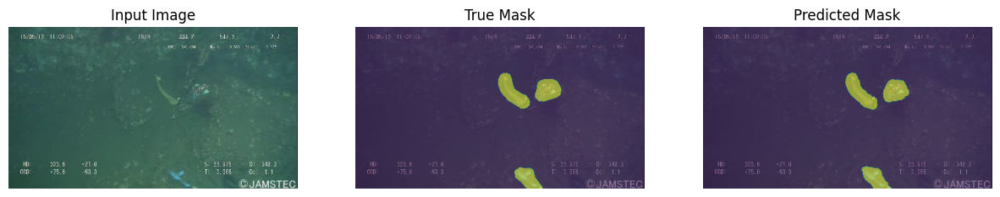

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


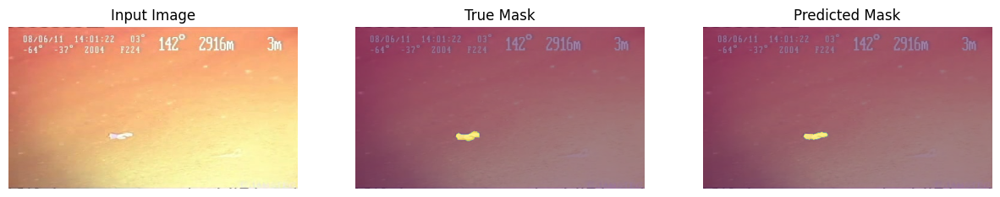

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


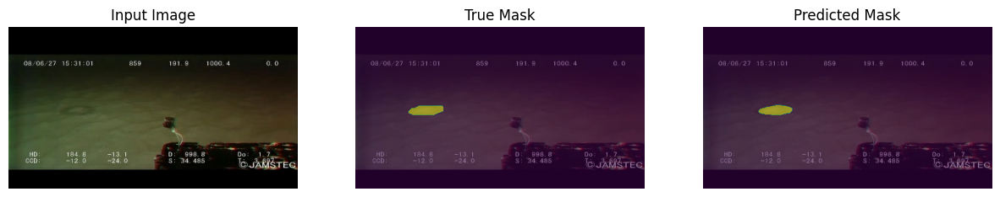

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


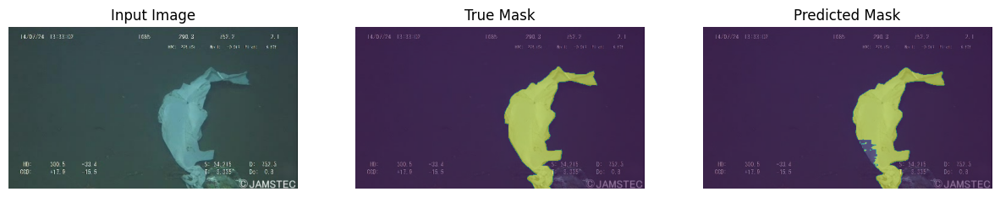

In [116]:
k=0
for image, mask in image_ds.take(60):
    i,m = image, mask
    jj = tf.reshape(i, [1, 270, 480, 3])
    pred_max = unet.predict([jj])
    pred_mask = tf.argmax(pred_max, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    display([i,m, pred_mask[0]],k)
    k=k+1

In [117]:
# array_np = pred_mask[0].numpy()

In [118]:
# np.unique(array_np)

In [119]:
unet.save_weights('/kaggle/working/unet_weights12.weights.h5')

In [120]:
# import shutil
# import os
# shutil.rmtree('/kaggle/working/flipped_images')
# shutil.rmtree('/kaggle/working/flipped_masks')
# shutil.rmtree('/kaggle/working/masks')
# os.remove("sample_submission.csv")


In [121]:
# os.listdir('/kaggle/input/unet-weights/')

In [122]:
# unet.load_weights('/kaggle/input/unet-weights-2/unet_weights.weights.h5')

In [123]:
# def create_submission2(val_images_dir, image_id_map, output_file="submission3.csv"):
#     with open(output_file, 'w', newline='') as file:
#         writer = csv.writer(file)
#         writer.writerow(['image_id', 'Mask'])

#         for img_file, img_id in image_id_map.items():
#             img_path = os.path.join(val_images_dir, img_file)
#             img = tf.io.read_file(img_path)
#             img = tf.image.decode_png(img, channels=3)
#             img = tf.image.convert_image_dtype(img, tf.float32)
            
#             jj = tf.reshape(img, [1, 270, 480, 3])
#             pred_max = unet.predict([jj])
            
#             pred_mask = tf.argmax(pred_max, axis=-1)
#             pred_mask = pred_mask[..., tf.newaxis]
            
#             mask = pred_mask[0].numpy()
    
#             encoded_mask = run_length_encode(mask)
#             writer.writerow([img_id, ' '.join(map(str, encoded_mask))])
#             encoded_mask = np.array(encoded_mask).reshape(-1,2)

# print("Preparing submission...")
# create_submission2(val_images, image_id_map)
# print("Submission is ready.")